<center><h1>Singaravelou_Ritika_HW5</h1></center>
<br>
<br>

Name: Ritika Singaravelou 
<br>
Github Username: ritika-singaravelou
<br>
USC ID: 6144091011

## 1. Decision Trees as Interpretable Models

Import packages

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import math
import warnings
warnings.filterwarnings('ignore')
from sklearn import tree
from sklearn.tree import _tree
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error,r2_score
from sklearn.model_selection import KFold,cross_val_score
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline
import sys
!{sys.executable} -m pip install xgboost
import xgboost as xgb


### (a) Obtain Data

#### Download the Accute Inflamations data from https://archive.ics.uci.edu/ml/datasets/Acute+Inflammations.



### Attribute Information:

#### a1 Temperature of patient { 35C-42C }

#### a2 Occurrence of nausea { yes, no }

#### a3 Lumbar pain { yes, no }

#### a4 Urine pushing (continuous need for urination) { yes, no }

#### a5 Micturition pains { yes, no }

#### a6 Burning of urethra, itch, swelling of urethra outlet { yes, no }

#### d1 decision: Inflammation of urinary bladder { yes, no }

#### d2 decision: Nephritis of renal pelvis origin { yes, no } 

In [2]:
diagnosis_df=pd.read_csv("../data/diagnosis.data",delimiter='\s+',encoding='utf-16',decimal=',',header=None)
diagnosis_df.columns=["a1","a2","a3","a4","a5","a6","d1","d2"]

In [3]:
diagnosis_df

,a1,a2,a3,a4,a5,a6,d1,d2
0,35.5,no,yes,no,no,no,no,no
1,35.9,no,no,yes,yes,yes,yes,no
2,35.9,no,yes,no,no,no,no,no
3,36.0,no,no,yes,yes,yes,yes,no
4,36.0,no,yes,no,no,no,no,no
...,...,...,...,...,...,...,...,...
115,41.4,no,yes,yes,no,yes,no,yes
116,41.5,no,no,no,no,no,no,no
117,41.5,yes,yes,no,yes,no,no,yes
118,41.5,no,yes,yes,no,yes,no,yes


In [4]:
for c in diagnosis_df.columns[1:]:
    diagnosis_df[c] = diagnosis_df[c].map({'yes': 1, 'no': 0})

In [5]:
diagnosis_df

,a1,a2,a3,a4,a5,a6,d1,d2
0,35.5,0,1,0,0,0,0,0
1,35.9,0,0,1,1,1,1,0
2,35.9,0,1,0,0,0,0,0
3,36.0,0,0,1,1,1,1,0
4,36.0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...
115,41.4,0,1,1,0,1,0,1
116,41.5,0,0,0,0,0,0,0
117,41.5,1,1,0,1,0,0,1
118,41.5,0,1,1,0,1,0,1


### 1 (b) Build a decision tree

### Build a decision tree on the whole data set and plot it

In [6]:
X = diagnosis_df.iloc[:, :-2]
Y1 = diagnosis_df.iloc[:, -2:-1]
Y2 = diagnosis_df.iloc[:, -1:]
Y1 = Y1.astype('int')
Y2 = Y2.astype('int')
Y=diagnosis_df.iloc[:, -2:]
Y=Y.astype('int')

In [7]:
X.shape

(120, 6)

In [8]:
Y1.shape

(120, 1)

In [9]:
dt1 = tree.DecisionTreeClassifier(random_state=50)
dt1 = dt1.fit(X, Y1)
print(tree.export_text(dt1))

|--- feature_3 <= 0.50
|   |--- class: 0
|--- feature_3 >  0.50
|   |--- feature_4 <= 0.50
|   |   |--- feature_0 <= 37.95
|   |   |   |--- class: 1
|   |   |--- feature_0 >  37.95
|   |   |   |--- class: 0
|   |--- feature_4 >  0.50
|   |   |--- class: 1



[Text(0.4, 0.875, 'x[3] <= 0.5\ngini = 0.5\nsamples = 120\nvalue = [61, 59]'),
 Text(0.2, 0.625, 'gini = 0.0\nsamples = 40\nvalue = [40, 0]'),
 Text(0.6, 0.625, 'x[4] <= 0.5\ngini = 0.387\nsamples = 80\nvalue = [21, 59]'),
 Text(0.4, 0.375, 'x[0] <= 37.95\ngini = 0.437\nsamples = 31\nvalue = [21, 10]'),
 Text(0.2, 0.125, 'gini = 0.0\nsamples = 10\nvalue = [0, 10]'),
 Text(0.6, 0.125, 'gini = 0.0\nsamples = 21\nvalue = [21, 0]'),
 Text(0.8, 0.375, 'gini = 0.0\nsamples = 49\nvalue = [0, 49]')]

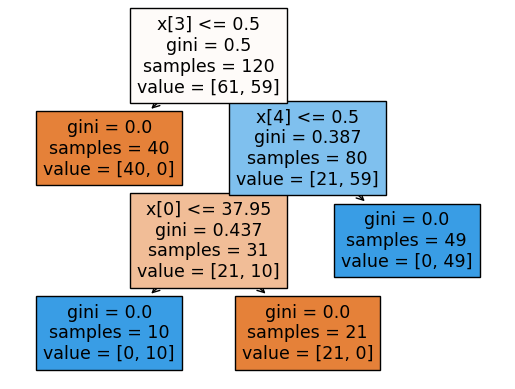

In [10]:
tree.plot_tree(dt1,filled=True)

In [11]:
Y2.shape

(120, 1)

In [12]:
dt2 = tree.DecisionTreeClassifier(random_state=50)
dt2 = dt2.fit(X, Y2)
print(tree.export_text(dt2))

|--- feature_0 <= 37.95
|   |--- class: 0
|--- feature_0 >  37.95
|   |--- feature_2 <= 0.50
|   |   |--- class: 0
|   |--- feature_2 >  0.50
|   |   |--- class: 1



[Text(0.4, 0.8333333333333334, 'x[0] <= 37.95\ngini = 0.486\nsamples = 120\nvalue = [70, 50]'),
 Text(0.2, 0.5, 'gini = 0.0\nsamples = 60\nvalue = [60, 0]'),
 Text(0.6, 0.5, 'x[2] <= 0.5\ngini = 0.278\nsamples = 60\nvalue = [10, 50]'),
 Text(0.4, 0.16666666666666666, 'gini = 0.0\nsamples = 10\nvalue = [10, 0]'),
 Text(0.8, 0.16666666666666666, 'gini = 0.0\nsamples = 50\nvalue = [0, 50]')]

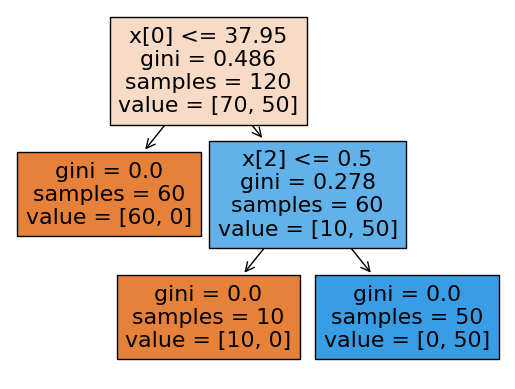

In [13]:
tree.plot_tree(dt2,filled=True)

In [14]:
Y.shape

(120, 2)

In [15]:
dt12 = tree.DecisionTreeClassifier(random_state=50)
dt12 = dt12.fit(X, Y)
print(tree.export_text(dt12))

|--- feature_0 <= 37.95
|   |--- feature_3 <= 0.50
|   |   |--- class: 0
|   |--- feature_3 >  0.50
|   |   |--- class: 1
|--- feature_0 >  37.95
|   |--- feature_2 <= 0.50
|   |   |--- class: 0
|   |--- feature_2 >  0.50
|   |   |--- feature_4 <= 0.50
|   |   |   |--- class: 0
|   |   |--- feature_4 >  0.50
|   |   |   |--- feature_3 <= 0.50
|   |   |   |   |--- class: 0
|   |   |   |--- feature_3 >  0.50
|   |   |   |   |--- class: 0



[Text(0.4, 0.9, 'x[0] <= 37.95\ngini = 0.493\nsamples = 120\nvalue = [[61, 59]\n[70, 50]]'),
 Text(0.2, 0.7, 'x[3] <= 0.5\ngini = 0.222\nsamples = 60\nvalue = [[20, 40]\n[60, 0]]'),
 Text(0.1, 0.5, 'gini = 0.0\nsamples = 20\nvalue = [[20, 0]\n[20, 0]]'),
 Text(0.3, 0.5, 'gini = 0.0\nsamples = 40\nvalue = [[0, 40]\n[40, 0]]'),
 Text(0.6, 0.7, 'x[2] <= 0.5\ngini = 0.355\nsamples = 60\nvalue = [[41, 19]\n[10, 50]]'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 10\nvalue = [[10, 0]\n[10, 0]]'),
 Text(0.7, 0.5, 'x[4] <= 0.5\ngini = 0.236\nsamples = 50\nvalue = [[31, 19]\n[0, 50]]'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 21\nvalue = [[21, 0]\n[0, 21]]'),
 Text(0.8, 0.3, 'x[3] <= 0.5\ngini = 0.226\nsamples = 29\nvalue = [[10, 19]\n[0, 29]]'),
 Text(0.7, 0.1, 'gini = 0.0\nsamples = 10\nvalue = [[10, 0]\n[0, 10]]'),
 Text(0.9, 0.1, 'gini = 0.0\nsamples = 19\nvalue = [[0, 19]\n[0, 19]]')]

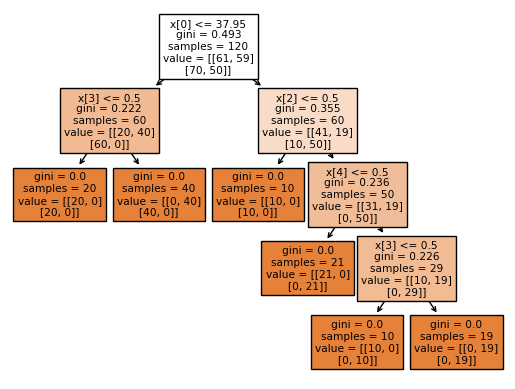

In [16]:
tree.plot_tree(dt12,filled=True)

### 1 (c) Convert the decision rules

### Convert the decision rules into a set of IF-THEN rules

In [17]:
from sklearn.tree import _tree

def tree_to_code(tree, feature_names):


    tree_ = tree.tree_
    feature_name = [
        feature_names[i] if i != _tree.TREE_UNDEFINED else "undefined!"
        for i in tree_.feature]
    print("def tree({}):".format(", ".join(feature_names)))

    def recurse(node, depth):
        indent = "  " * depth
        if tree_.feature[node] != _tree.TREE_UNDEFINED:
            name = feature_name[node]
            threshold = tree_.threshold[node]
            print("{}if {} <= {}:".format(indent, name, threshold))
            recurse(tree_.children_left[node], depth + 1)
            print("{}else:  # if {} > {}".format(indent, name, threshold))
            recurse(tree_.children_right[node], depth + 1)
        else:
            print("{}return {}".format(indent, tree_.value[node]))

    recurse(0, 1)

In [18]:
tree_to_code(dt12, list(diagnosis_df.columns[:6]))

def tree(a1, a2, a3, a4, a5, a6):
  if a1 <= 37.95000076293945:
    if a4 <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if a4 > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if a1 > 37.95000076293945
    if a3 <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if a3 > 0.5
      if a5 <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if a5 > 0.5
        if a4 <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if a4 > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


### Note:

  #### a1 - Temperature of patient 
  #### a2 -  Occurrence of nausea

  #### a3 - Lumbar pain

  #### a4 - Urine pushing (continuous need for urination) 

  #### a5 -  Micturition pains 

  #### a6 - Burning of urethra, itch, swelling of urethra outlet 

In [19]:
#with detailed feature names
tree_to_code(dt12, ['temperature', 'nausea_occurence', 'lumbar_pain', 'urine_pushing', 'micturition_pains', 'burning_of_urethra'])

def tree(temperature, nausea_occurence, lumbar_pain, urine_pushing, micturition_pains, burning_of_urethra):
  if temperature <= 37.95000076293945:
    if urine_pushing <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if urine_pushing > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if temperature > 37.95000076293945
    if lumbar_pain <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if lumbar_pain > 0.5
      if micturition_pains <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if micturition_pains > 0.5
        if urine_pushing <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if urine_pushing > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


### 1 (d) Use cost-complexity pruning to find a minimal decision tree and a set of decision rules with high interpretability.


In [20]:
dt=tree.DecisionTreeClassifier(random_state=50).fit(X,Y)
alpha=dt.cost_complexity_pruning_path(X, Y)['ccp_alphas']
print(alpha)

[0.         0.04908333 0.07947222 0.11111111 0.20423611]


In [21]:
dt = tree.DecisionTreeClassifier(random_state = 50)
dt = GridSearchCV(dt, cv = 5, param_grid = {'ccp_alpha': alpha}, scoring = 'neg_mean_squared_error')
dt.fit(X, Y)
best_alpha=dt.best_params_['ccp_alpha']
print("Cost-Complexity Pruning - best alpha value: "+str(best_alpha))



Cost-Complexity Pruning - best alpha value: 0.0


[Text(0.4, 0.9, 'x[0] <= 37.95\ngini = 0.493\nsamples = 120\nvalue = [[61, 59]\n[70, 50]]'),
 Text(0.2, 0.7, 'x[3] <= 0.5\ngini = 0.222\nsamples = 60\nvalue = [[20, 40]\n[60, 0]]'),
 Text(0.1, 0.5, 'gini = 0.0\nsamples = 20\nvalue = [[20, 0]\n[20, 0]]'),
 Text(0.3, 0.5, 'gini = 0.0\nsamples = 40\nvalue = [[0, 40]\n[40, 0]]'),
 Text(0.6, 0.7, 'x[2] <= 0.5\ngini = 0.355\nsamples = 60\nvalue = [[41, 19]\n[10, 50]]'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 10\nvalue = [[10, 0]\n[10, 0]]'),
 Text(0.7, 0.5, 'x[4] <= 0.5\ngini = 0.236\nsamples = 50\nvalue = [[31, 19]\n[0, 50]]'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 21\nvalue = [[21, 0]\n[0, 21]]'),
 Text(0.8, 0.3, 'x[3] <= 0.5\ngini = 0.226\nsamples = 29\nvalue = [[10, 19]\n[0, 29]]'),
 Text(0.7, 0.1, 'gini = 0.0\nsamples = 10\nvalue = [[10, 0]\n[0, 10]]'),
 Text(0.9, 0.1, 'gini = 0.0\nsamples = 19\nvalue = [[0, 19]\n[0, 19]]')]

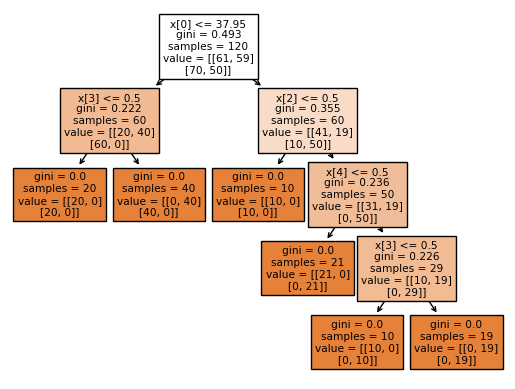

In [22]:
#using best alpha from cost complexity pruning
dt_ba = tree.DecisionTreeClassifier(ccp_alpha = best_alpha, random_state = 50)
dt_ba.fit(X, Y)
tree.plot_tree(dt_ba, filled = True)

In [23]:
tree_to_code(dt_ba, list(diagnosis_df.columns[:6]))

def tree(a1, a2, a3, a4, a5, a6):
  if a1 <= 37.95000076293945:
    if a4 <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if a4 > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if a1 > 37.95000076293945
    if a3 <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if a3 > 0.5
      if a5 <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if a5 > 0.5
        if a4 <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if a4 > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


### Note:

  #### a1 - Temperature of patient 
  #### a2 -  Occurrence of nausea

  #### a3 - Lumbar pain

  #### a4 - Urine pushing (continuous need for urination) 

  #### a5 -  Micturition pains 

  #### a6 - Burning of urethra, itch, swelling of urethra outlet 

In [24]:
#with detailed feature names
tree_to_code(dt_ba, ['temperature', 'nausea_occurence', 'lumbar_pain', 'urine_pushing', 'micturition_pains', 'burning_of_urethra'])

def tree(temperature, nausea_occurence, lumbar_pain, urine_pushing, micturition_pains, burning_of_urethra):
  if temperature <= 37.95000076293945:
    if urine_pushing <= 0.5:
      return [[20.  0.]
 [20.  0.]]
    else:  # if urine_pushing > 0.5
      return [[ 0. 40.]
 [40.  0.]]
  else:  # if temperature > 37.95000076293945
    if lumbar_pain <= 0.5:
      return [[10.  0.]
 [10.  0.]]
    else:  # if lumbar_pain > 0.5
      if micturition_pains <= 0.5:
        return [[21.  0.]
 [ 0. 21.]]
      else:  # if micturition_pains > 0.5
        if urine_pushing <= 0.5:
          return [[10.  0.]
 [ 0. 10.]]
        else:  # if urine_pushing > 0.5
          return [[ 0. 19.]
 [ 0. 19.]]


## 2. The LASSO and Boosting for Regression

### 2 (a) Obtain Data

### Download the Communities and Crime data3 from https://archive.ics.uci.edu/ml/datasets/Communities+and+Crime. Use the first 1495 rows of data as the training set and the rest as the test set.



In [25]:
comm_df=pd.read_csv("../data/communities.data",delimiter=',',header = None, na_values = '?')
comm_df_cols=[]
for l in open("../data/communities.names"):
    if "@attribute" in l:
        comm_df_cols.append(l.split(' ')[1])

In [26]:
comm_df.columns=comm_df_cols
comm_df        

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


In [27]:
train_df=comm_df[:1495]
test_df=comm_df[1495:]

In [28]:
train_df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.90,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5.0,81440.0,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95.0,6096.0,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,6,NaN,NaN,Hillsboroughtown,8,0.00,0.59,0.01,0.69,1.00,...,0.02,0.14,0.22,NaN,NaN,NaN,NaN,0.00,NaN,0.03
1491,6,NaN,NaN,Orangecity,8,0.16,0.62,0.03,0.74,0.48,...,0.07,0.40,0.14,0.07,0.05,0.85,0.5,0.61,0.19,0.20
1492,13,NaN,NaN,Waycrosscity,8,0.01,0.36,0.95,0.24,0.03,...,0.03,0.12,0.01,NaN,NaN,NaN,NaN,0.00,NaN,0.30
1493,39,85.0,49056.0,Mentorcity,8,0.06,0.53,0.01,0.98,0.05,...,0.08,0.15,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03


In [29]:
test_df

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
1495,6,NaN,NaN,MillValleycity,8,0.00,0.20,0.03,0.91,0.23,...,0.01,0.23,0.73,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1496,48,NaN,NaN,LiveOakcity,8,0.00,0.55,0.13,0.78,0.15,...,0.01,0.18,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.11
1497,35,NaN,NaN,Portalescity,8,0.00,0.52,0.04,0.59,0.05,...,0.01,0.18,0.00,NaN,NaN,NaN,NaN,0.00,NaN,0.12
1498,42,17.0,25112.0,Fallstownship,8,0.04,0.51,0.07,0.92,0.09,...,0.06,0.13,0.16,NaN,NaN,NaN,NaN,0.00,NaN,0.06
1499,51,683.0,48952.0,Manassascity,8,0.03,0.59,0.20,0.75,0.19,...,0.03,0.23,0.06,NaN,NaN,NaN,NaN,0.00,NaN,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9.0,80070.0,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0.0,0.91,0.28,0.23
1992,25,17.0,72600.0,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0.0,0.22,0.18,0.19


### 1 (b) Missing values

### The data set has missing values. Use a data imputation technique to deal with the missing values in the data set. The data description mentions some features are nonpredictive. Ignore those features.

In [30]:
#drop non-predictive features - state, county, community, communityname, fold
comm_df_postdrop=comm_df.drop(columns=['state', 'county', 'community', 'communityname', 'fold'])
train_df=comm_df_postdrop[:1495]
test_df=comm_df_postdrop[1495:]

In [31]:
#finding columns with missing values
cols_with_missingvals=[]
for c in comm_df_postdrop.columns:
    if comm_df[c].isnull().sum()>0:
        cols_with_missingvals.append(c)
print(cols_with_missingvals)

['OtherPerCap', 'LemasSwornFT', 'LemasSwFTPerPop', 'LemasSwFTFieldOps', 'LemasSwFTFieldPerPop', 'LemasTotalReq', 'LemasTotReqPerPop', 'PolicReqPerOffic', 'PolicPerPop', 'RacialMatchCommPol', 'PctPolicWhite', 'PctPolicBlack', 'PctPolicHisp', 'PctPolicAsian', 'PctPolicMinor', 'OfficAssgnDrugUnits', 'NumKindsDrugsSeiz', 'PolicAveOTWorked', 'PolicCars', 'PolicOperBudg', 'LemasPctPolicOnPatr', 'LemasGangUnitDeploy', 'PolicBudgPerPop']


In [32]:
#imputing by using mean
imputer = SimpleImputer(strategy = 'mean', missing_values = np.nan)
for c in cols_with_missingvals:
    imputer = imputer.fit(train_df[[c]])
    train_df[[c]] = imputer.transform(train_df[[c]])
    test_df[[c]] = imputer.transform(test_df[[c]])
    

In [33]:
postimpute_fulldf=pd.concat([train_df,test_df])
postimpute_fulldf

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.080000,0.060000,0.780000,0.000000,0.91,0.280000,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.020000,0.020000,0.790000,0.000000,0.22,0.180000,0.19


In [34]:
train_df

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,...,0.12,0.26,0.20,0.060000,0.040000,0.900000,0.500000,0.32,0.140000,0.20
1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,...,0.02,0.12,0.45,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.67
2,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,...,0.01,0.21,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.43
3,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,...,0.02,0.39,0.28,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
4,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,...,0.04,0.09,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1490,0.00,0.59,0.01,0.69,1.00,0.07,0.41,0.28,0.23,0.57,...,0.02,0.14,0.22,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03
1491,0.16,0.62,0.03,0.74,0.48,0.42,0.44,0.57,0.40,0.25,...,0.07,0.40,0.14,0.070000,0.050000,0.850000,0.500000,0.61,0.190000,0.20
1492,0.01,0.36,0.95,0.24,0.03,0.01,0.44,0.42,0.27,0.63,...,0.03,0.12,0.01,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.30
1493,0.06,0.53,0.01,0.98,0.05,0.01,0.40,0.40,0.24,0.29,...,0.08,0.15,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.03


In [35]:
test_df

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
1495,0.00,0.20,0.03,0.91,0.23,0.05,0.15,0.19,0.09,0.42,...,0.01,0.23,0.73,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
1496,0.00,0.55,0.13,0.78,0.15,0.36,0.48,0.53,0.30,0.10,...,0.01,0.18,0.02,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.11
1497,0.00,0.52,0.04,0.59,0.05,0.62,0.84,0.78,0.75,0.43,...,0.01,0.18,0.00,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
1498,0.04,0.51,0.07,0.92,0.09,0.03,0.38,0.47,0.27,0.35,...,0.06,0.13,0.16,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.06
1499,0.03,0.59,0.20,0.75,0.19,0.10,0.38,0.62,0.35,0.11,...,0.03,0.23,0.06,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,...,0.01,0.28,0.05,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.09
1990,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,...,0.02,0.37,0.20,0.163975,0.080502,0.713054,0.451883,0.00,0.190753,0.45
1991,0.16,0.37,0.25,0.69,0.04,0.25,0.35,0.50,0.31,0.54,...,0.08,0.32,0.18,0.080000,0.060000,0.780000,0.000000,0.91,0.280000,0.23
1992,0.08,0.51,0.06,0.87,0.22,0.10,0.58,0.74,0.63,0.41,...,0.03,0.38,0.33,0.020000,0.020000,0.790000,0.000000,0.22,0.180000,0.19


### 2 (c) Plot a correlation matrix

### Plot a correlation matrix for the features in the data set.


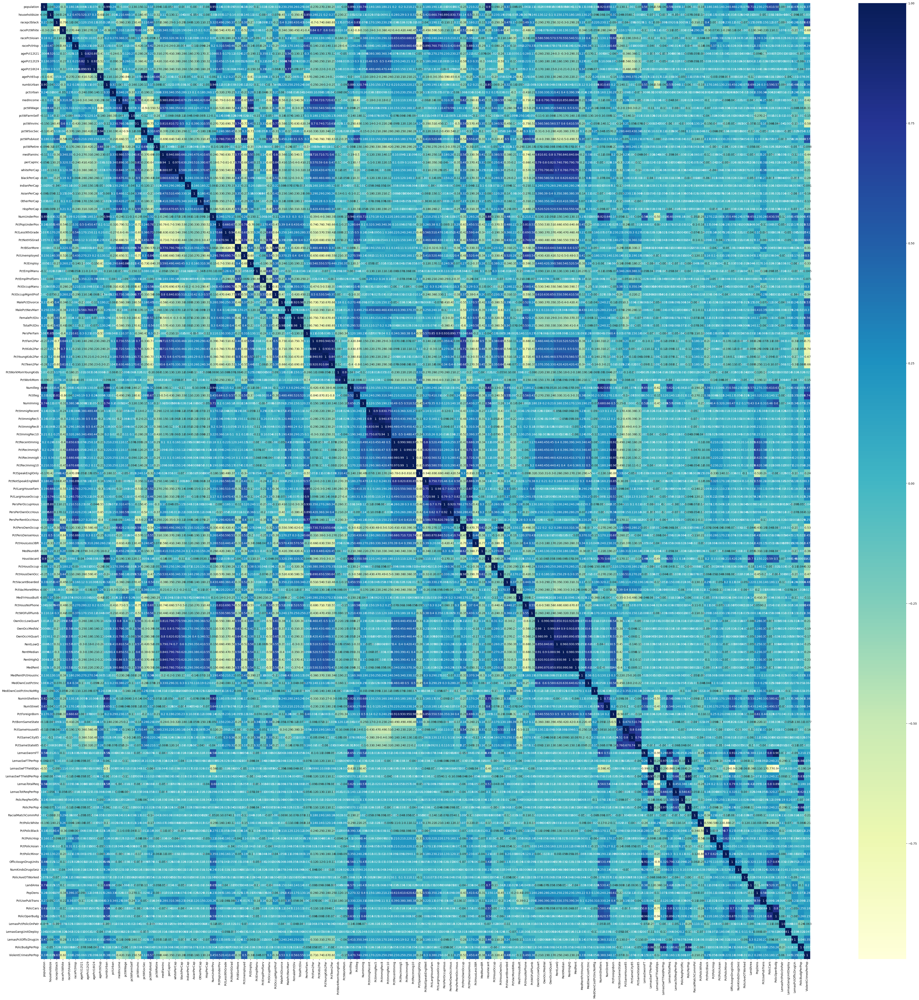

In [36]:
plt.figure(figsize=(60, 60))
corr = postimpute_fulldf.corr()
sns.heatmap(corr, cmap="YlGnBu", annot=True)
plt.show()

### 2 (d) Calculate the Coefficient of Variation CV

### Calculate the Coefficient of Variation CV for each feature, where CV = s/m, in which s is sample standard deviation and m is sample mean

In [37]:
cv_allfeats=pd.DataFrame()
cv_allfeats.index=['mean', 'standard deviation', 'coefficient of variation']


In [38]:
for c in postimpute_fulldf.columns:
    mean=postimpute_fulldf[c].mean()
    std=postimpute_fulldf[c].std()
    cv_allfeats[c]=[mean,std,(std/mean)]
cv_allfeats

,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
mean,0.057593,0.463395,0.179629,0.753716,0.153681,0.144022,0.424218,0.493867,0.336264,0.423164,...,0.065231,0.232854,0.161685,0.163835,0.079895,0.710740,0.450052,0.094052,0.191445,0.237979
standard deviation,0.126906,0.163717,0.253442,0.244039,0.208877,0.232492,0.155196,0.143564,0.166505,0.179185,...,0.109459,0.203092,0.229055,0.085793,0.056023,0.085624,0.162153,0.240328,0.065815,0.232985
coefficient of variation,2.203503,0.353298,1.410920,0.323782,1.359162,1.614278,0.365840,0.290693,0.495161,0.423442,...,1.678031,0.872187,1.416673,0.523655,0.701202,0.120471,0.360299,2.555266,0.343782,0.979015


### 2 (e) Scatter plots and box plots for highest CV features

### Pick |_√128_| features with highest CV , and make scatter plots and box plots for them. Can you draw conclusions about significance of those features, just by the scatter plots?

In [39]:
no_feats=int(np.floor(np.sqrt(128)))
print(no_feats)
sorted_cv_feats=cv_allfeats.loc['coefficient of variation'].sort_values(ascending=False)
top_feats=sorted_cv_feats[0:no_feats]
top_featnames=top_feats.index
print("Features with Highest CV : ")
print(top_feats)

11
Features with Highest CV : 
NumStreet              4.407702
NumInShelters          3.485481
NumIlleg               2.994196
NumImmig               2.900497
LemasPctOfficDrugUn    2.555266
NumUnderPov            2.304970
population             2.203503
numbUrban              2.001744
HousVacant             1.958780
LandArea               1.678031
racePctHisp            1.614278
Name: coefficient of variation, dtype: float64


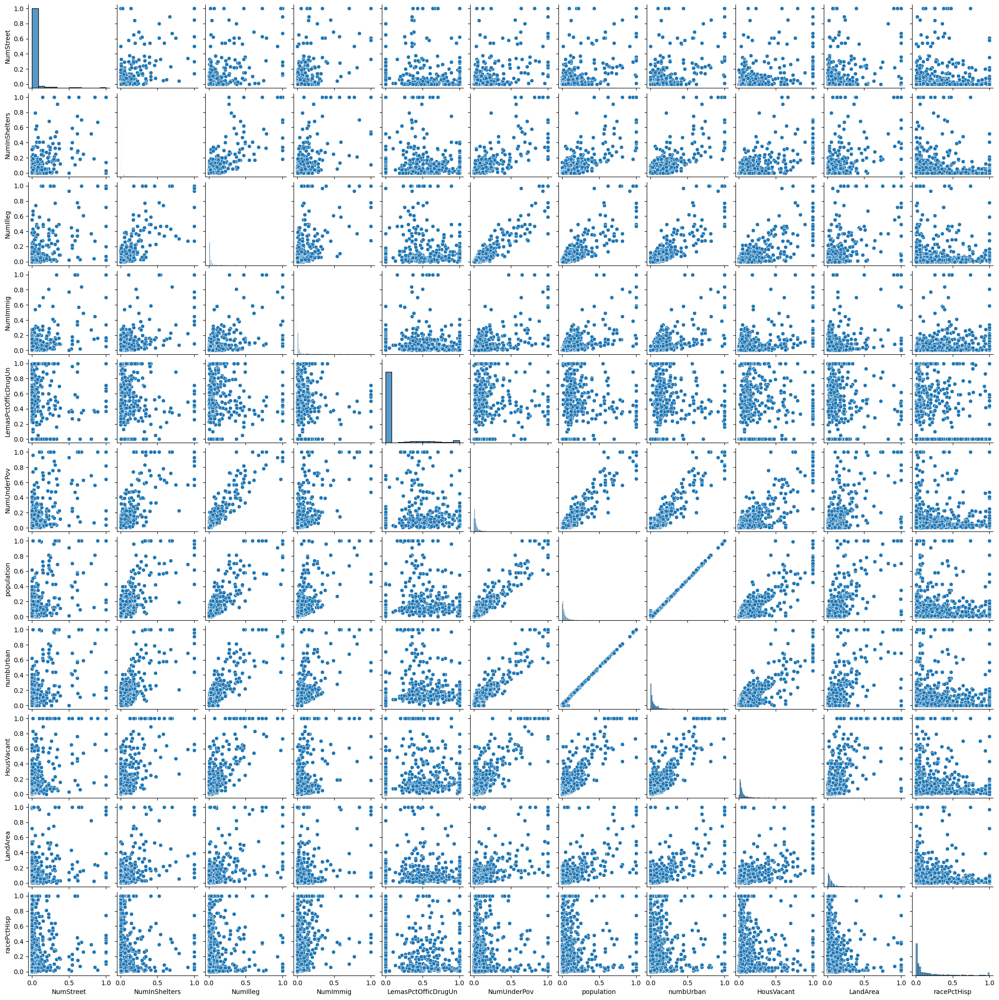

In [40]:
sns.pairplot(data = postimpute_fulldf[top_featnames], height = 2)

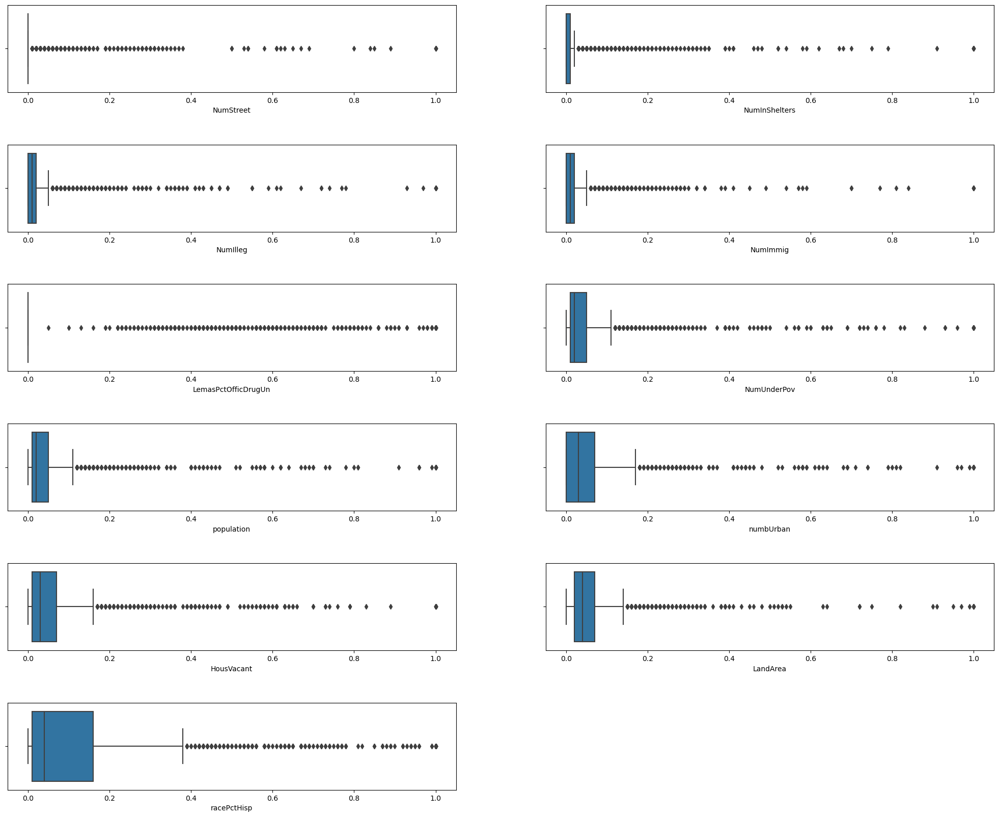

In [41]:
plt.figure(figsize = (25, 20))
for i, c in enumerate(top_featnames):
    plt.subplot(int(len(top_featnames)/2) + 1, 2, i + 1)
    sns.boxplot(x = c, data = postimpute_fulldf)
plt.subplots_adjust(wspace = 0.2, hspace = 0.6)

#### It can be observed that the scatterplots are completely scattered. Hence, we can't draw conclusions about the significance of the selected features just based on the scatterplots alone. But combining the scatterplots with the boxplots gives some scope for inference, especially when the data points are increasing. 

### 2 (f) Fit a linear model

### Fit a linear model using least squares to the training set and report the test error.

In [42]:

trainx, trainy = train_df.iloc[:, :-1], train_df.iloc[:, -1]
train_c = sm.add_constant(trainx)
lin_model = sm.OLS(trainy, train_c).fit()
print(lin_model.summary())

trainpredy =lin_model.predict(train_c)
trainerr = np.round(mean_squared_error(trainy, trainpredy), 5)


                             OLS Regression Results                            
Dep. Variable:     ViolentCrimesPerPop   R-squared:                       0.711
Model:                             OLS   Adj. R-squared:                  0.686
Method:                  Least Squares   F-statistic:                     27.94
Date:                 Fri, 27 Oct 2023   Prob (F-statistic):          6.56e-291
Time:                         23:43:28   Log-Likelihood:                 955.40
No. Observations:                 1495   AIC:                            -1667.
Df Residuals:                     1373   BIC:                            -1019.
Df Model:                          121                                         
Covariance Type:             nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const               

In [43]:
testx, testy = test_df.iloc[:, :-1], test_df.iloc[:, -1]
test_c = sm.add_constant(testx)
testpredy = lin_model.predict(test_c)
testerr=np.round(mean_squared_error(testy, testpredy), 5)

In [44]:
print("Linear Model : ")
print("Train Mean Squared Error = "+str(trainerr))
print("Test Mean Squared Error = "+str(testerr))

Linear Model : 
Train Mean Squared Error = 0.01631
Test Mean Squared Error = 0.01814


#### Linear Model Using Least Squares 
#### Test Error = 0.01814

### 2 (g) Fit a ridge regression model

### Fit a ridge regression model on the training set, with λ chosen by cross-validation. Report the test error obtained.


In [45]:
alpha_list=[]
for i in range(-10,11):
    alpha_list.append(pow(10,i))
alpha_list

[1e-10,
 1e-09,
 1e-08,
 1e-07,
 1e-06,
 1e-05,
 0.0001,
 0.001,
 0.01,
 0.1,
 1,
 10,
 100,
 1000,
 10000,
 100000,
 1000000,
 10000000,
 100000000,
 1000000000,
 10000000000]

In [46]:
ridgereg_model = RidgeCV(alphas=alpha_list,cv = KFold(n_splits = 5, random_state = 50, shuffle = True))
ridgereg_model.fit(trainx, trainy)
testpredy =ridgereg_model.predict(testx)
best_alpha_ridgereg =ridgereg_model.alpha_
testerr=np.round(mean_squared_error(testy, testpredy), 5)
testr2=np.round(r2_score(testy, testpredy), 5)

In [47]:
print("Ridge Regression Model : ")
print("Best Lambda = "+str(best_alpha_ridgereg))
print("Test Mean Squared Error = "+str(testerr))
print("Test R2 Score = "+str(testr2))

Ridge Regression Model : 
Best Lambda = 1.0
Test Mean Squared Error = 0.01773
Test R2 Score = 0.62712


#### Ridge Regression Model
#### Best $\lambda$ chosen by cross-validation = 1.0
#### Test Error = 0.01773

### (h) Fit a LASSO model

### Fit a LASSO model on the training set, with λ chosen by cross-validation. Report the test error obtained, along with a list of the variables selected by the model. Repeat with standardized features. Report the test error for both cases and compare them.

In [48]:
#lasso - without standardized features
lasso_nostd_model = LassoCV(alphas=alpha_list,cv = KFold(n_splits = 5, random_state = 50, shuffle = True))
lasso_nostd_model.fit(trainx, trainy)
testpredy =lasso_nostd_model.predict(testx)
best_alpha_lasso_nostd =lasso_nostd_model.alpha_
testerr=np.round(mean_squared_error(testy, testpredy), 5)
testr2=np.round(r2_score(testy, testpredy), 5)

In [49]:
print("Lasso Model (without standardized features) : ")
print("Best Lambda = "+str(best_alpha_lasso_nostd))
print("Test Mean Squared Error = "+str(testerr))
print("Test R2 Score = "+str(testr2))

Lasso Model (without standardized features) : 
Best Lambda = 0.0001
Test Mean Squared Error = 0.01779
Test R2 Score = 0.62599


#### LASSO Model with non-standardized features
#### Best $\lambda$ chosen by cross-validation = 0.0001
#### Test Error = 0.01779

In [50]:
selected_feats_lasso_nostd={}
for i in range(len(trainx.columns)):
    if lasso_nostd_model.coef_[i]!=0:
        selected_feats_lasso_nostd[trainx.columns[i]]=np.round(lasso_nostd_model.coef_[i],4)

print(len(selected_feats_lasso_nostd))


selected_feats_lasso_nostd
        

78


{'racepctblack': 0.2731,
 'racePctAsian': -0.018,
 'agePct12t21': 0.076,
 'agePct12t29': -0.2911,
 'agePct65up': 0.0039,
 'pctUrban': 0.041,
 'pctWWage': -0.0932,
 'pctWFarmSelf': 0.0291,
 'pctWInvInc': -0.1101,
 'pctWSocSec': 0.0592,
 'pctWPubAsst': 0.0418,
 'pctWRetire': -0.1098,
 'whitePerCap': -0.0695,
 'blackPerCap': -0.0225,
 'indianPerCap': -0.0319,
 'AsianPerCap': 0.0292,
 'OtherPerCap': 0.0236,
 'HispPerCap': 0.0257,
 'PctPopUnderPov': -0.1501,
 'PctLess9thGrade': -0.0213,
 'PctBSorMore': 0.0173,
 'PctEmploy': 0.155,
 'PctEmplManu': -0.0192,
 'PctOccupManu': 0.0165,
 'MalePctDivorce': 0.1326,
 'MalePctNevMarr': 0.1507,
 'FemalePctDiv': -0.0956,
 'PctKids2Par': -0.1981,
 'PctYoungKids2Par': -0.036,
 'PctTeen2Par': -0.0115,
 'PctWorkMom': -0.1347,
 'NumIlleg': -0.0623,
 'PctIlleg': 0.0956,
 'NumImmig': -0.0812,
 'PctImmigRec10': -0.0056,
 'PctRecImmig10': 0.0393,
 'PctNotSpeakEnglWell': -0.0808,
 'PctLargHouseOccup': -0.0895,
 'PersPerOccupHous': 0.0733,
 'PctPersOwnOccup': -0.0

In [51]:
print("List of variables selected by the model : ")
print(list(selected_feats_lasso_nostd.keys()))

List of variables selected by the model : 
['racepctblack', 'racePctAsian', 'agePct12t21', 'agePct12t29', 'agePct65up', 'pctUrban', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWPubAsst', 'pctWRetire', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'OtherPerCap', 'HispPerCap', 'PctPopUnderPov', 'PctLess9thGrade', 'PctBSorMore', 'PctEmploy', 'PctEmplManu', 'PctOccupManu', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig', 'PctImmigRec10', 'PctRecImmig10', 'PctNotSpeakEnglWell', 'PctLargHouseOccup', 'PersPerOccupHous', 'PctPersOwnOccup', 'PctPersDenseHous', 'PctHousLess3BR', 'MedNumBR', 'HousVacant', 'PctHousOccup', 'PctVacantBoarded', 'PctVacMore6Mos', 'MedYrHousBuilt', 'PctHousNoPhone', 'PctWOFullPlumb', 'OwnOccLowQuart', 'RentLowQ', 'MedRent', 'MedRentPctHousInc', 'MedOwnCostPctInc', 'MedOwnCostPctIncNoMtg', 'NumInShelters', 'NumStreet', 'PctForeignBorn', '

In [52]:
#lasso - with standardized features
lasso_std_model = LassoCV(alphas=alpha_list,cv = KFold(n_splits = 5, random_state = 50, shuffle = True))
scaler = StandardScaler()
trainx_std=scaler.fit_transform(trainx)
testx_std=scaler.fit_transform(testx)
lasso_std_model.fit(trainx_std, trainy)
testpredy =lasso_std_model.predict(testx_std)
best_alpha_lasso_std =lasso_std_model.alpha_
testerr=np.round(mean_squared_error(testy, testpredy), 5)
testr2=np.round(r2_score(testy, testpredy), 5)

In [53]:
print("Lasso Regression Model (with standardized features) : ")
print("Best Lambda = "+str(best_alpha_lasso_std))
print("Test Mean Squared Error = "+str(testerr))
print("Test R2 Score = "+str(testr2))

Lasso Regression Model (with standardized features) : 
Best Lambda = 0.001
Test Mean Squared Error = 0.01795
Test R2 Score = 0.62256


#### LASSO Model with standardized features
#### Best $\lambda$ chosen by cross-validation = 0.001
#### Test Error = 0.01795

In [54]:
selected_feats_lasso_std={}
for i in range(len(trainx.columns)):
    if lasso_std_model.coef_[i]!=0:
        selected_feats_lasso_std[trainx.columns[i]]=np.round(lasso_std_model.coef_[i],4)

print(len(selected_feats_lasso_std))
selected_feats_lasso_std

68


{'racepctblack': 0.0668,
 'agePct12t21': 0.0053,
 'agePct12t29': -0.0286,
 'pctUrban': 0.0157,
 'pctWWage': -0.0088,
 'pctWFarmSelf': 0.0029,
 'pctWInvInc': -0.0181,
 'pctWSocSec': 0.0068,
 'pctWPubAsst': 0.0035,
 'pctWRetire': -0.0157,
 'whitePerCap': -0.0041,
 'blackPerCap': -0.0031,
 'indianPerCap': -0.005,
 'AsianPerCap': 0.0049,
 'OtherPerCap': 0.0034,
 'HispPerCap': 0.0031,
 'PctPopUnderPov': -0.021,
 'PctLess9thGrade': -0.0002,
 'PctEmploy': 0.0143,
 'PctEmplManu': -0.0002,
 'MalePctDivorce': 0.0151,
 'MalePctNevMarr': 0.0151,
 'FemalePctDiv': -0.0024,
 'PctKids2Par': -0.0396,
 'PctYoungKids2Par': -0.0088,
 'PctTeen2Par': -0.0006,
 'PctWorkMom': -0.0192,
 'NumIlleg': -0.0016,
 'PctIlleg': 0.0255,
 'NumImmig': -0.0064,
 'PctImmigRec5': -0.0006,
 'PctRecImmig10': 0.0043,
 'PctNotSpeakEnglWell': -0.0032,
 'PctLargHouseOccup': -0.0,
 'PctPersOwnOccup': -0.0065,
 'PctPersDenseHous': 0.0333,
 'PctHousLess3BR': 0.0087,
 'HousVacant': 0.016,
 'PctHousOccup': -0.0117,
 'PctVacantBoarded'

In [55]:
print("List of variables selected by the model : ")
print(list(selected_feats_lasso_std.keys()))

List of variables selected by the model : 
['racepctblack', 'agePct12t21', 'agePct12t29', 'pctUrban', 'pctWWage', 'pctWFarmSelf', 'pctWInvInc', 'pctWSocSec', 'pctWPubAsst', 'pctWRetire', 'whitePerCap', 'blackPerCap', 'indianPerCap', 'AsianPerCap', 'OtherPerCap', 'HispPerCap', 'PctPopUnderPov', 'PctLess9thGrade', 'PctEmploy', 'PctEmplManu', 'MalePctDivorce', 'MalePctNevMarr', 'FemalePctDiv', 'PctKids2Par', 'PctYoungKids2Par', 'PctTeen2Par', 'PctWorkMom', 'NumIlleg', 'PctIlleg', 'NumImmig', 'PctImmigRec5', 'PctRecImmig10', 'PctNotSpeakEnglWell', 'PctLargHouseOccup', 'PctPersOwnOccup', 'PctPersDenseHous', 'PctHousLess3BR', 'HousVacant', 'PctHousOccup', 'PctVacantBoarded', 'PctVacMore6Mos', 'MedYrHousBuilt', 'PctWOFullPlumb', 'RentLowQ', 'MedRent', 'MedRentPctHousInc', 'MedOwnCostPctInc', 'MedOwnCostPctIncNoMtg', 'NumInShelters', 'NumStreet', 'PctForeignBorn', 'PctSameCity85', 'LemasSwFTFieldPerPop', 'LemasTotalReq', 'PolicReqPerOffic', 'RacialMatchCommPol', 'PctPolicBlack', 'PctPolicHisp'

#### There is no vast difference in test mean squared error between LASSO model trained with non-standardized and standardized features. Based on the values obtained above, we can say that the test error in the case of non-standardized features is slightly lower than the test error for standardized features.

### (i) Fit a PCR model

### Fit a PCR model on the training set, with M (the number of principal components) chosen by cross-validation. Report the test error obtained

In [56]:
pca_scores = []
for i in range(1, 1 + len(trainx.columns)):
    pcamodel = PCA(n_components = i)
    linregmodel = LinearRegression(fit_intercept = True)    
    scores = cross_val_score(make_pipeline(pcamodel, linregmodel), trainx, trainy,cv = KFold(5, shuffle = True, random_state = 50), 
                                 n_jobs = -1, scoring = "neg_mean_squared_error")
    pca_scores.append(sum(abs(scores))/len(scores))

for i in range(len(trainx.columns)):
    print(str(i+1)+" , "+str(pca_scores[i]))
    

1 , 0.03803470505459276
2 , 0.030671634725240406
3 , 0.02788069096440987
4 , 0.024430164601835683
5 , 0.023111782567852006
6 , 0.022593994641170578
7 , 0.020160870038507778
8 , 0.020194434296333157
9 , 0.02012483998201827
10 , 0.020044798511090096
11 , 0.02008501805827074
12 , 0.02012936002148353
13 , 0.020044107749509106
14 , 0.020041723080707105
15 , 0.020044218944706337
16 , 0.020053769621017254
17 , 0.02008202659762846
18 , 0.020100449041178855
19 , 0.020134684580815968
20 , 0.020124365159259576
21 , 0.020190188321657643
22 , 0.020149717212414743
23 , 0.020058394061591624
24 , 0.01996381717125626
25 , 0.019982385494801143
26 , 0.020024676557880858
27 , 0.01997607521287749
28 , 0.0199906958338223
29 , 0.019965568519935237
30 , 0.01992509226130569
31 , 0.019917164942361086
32 , 0.019957252800126748
33 , 0.019905420470229994
34 , 0.01993628209016641
35 , 0.019938558768200332
36 , 0.019920758267060842
37 , 0.019892740765168906
38 , 0.01990691868598776
39 , 0.01990915569930498
40 , 0.01

In [57]:
min_score=pca_scores[0]
for i in pca_scores:
    if i<min_score:
        min_score=i
        M=pca_scores.index(min_score)+1
print("Chosen M (the number of principal components) = "+str(M))
print("Corresponding Minimum Validation Error = "+str(min_score))

Chosen M (the number of principal components) = 94
Corresponding Minimum Validation Error = 0.019459061482537


In [58]:
pcamodel_M = PCA(n_components = M)
pcamodel_M.fit(trainx)
trainxpca = pcamodel_M.transform(trainx)
testxpca = pcamodel_M.transform(testx)
linregmodel = LinearRegression().fit(trainxpca, trainy)
testpredy = linregmodel.predict(testxpca)
testerr = np.round(mean_squared_error(testy, testpredy), 5) 

In [59]:
print("PCR Model : ")
print("Test Mean Squared Error = "+str(testerr))

PCR Model : 
Test Mean Squared Error = 0.01852


#### PCR Model
#### Test Error = 0.01852

### (j) Fit a boosting tree

### In this section, we would like to fit a boosting tree to the data. As in classification trees, one can use any type of regression at each node to build a multivariate regression tree. Because the number of variables is large in this problem, one can use L1-penalized regression at each node. Such a tree is called L1 penalized gradient boosting tree. You can use XGBoost to fit the model tree. Determine α (the regularization term) using cross-validation.


In [60]:
bt_scores=[]
for alpha in alpha_list:
    xgbmodel = xgb.XGBRegressor(reg_alpha = alpha, random_state = 50)
    score = cross_val_score(xgbmodel, trainx, trainy,cv = KFold(5, shuffle = True, random_state = 50),
                              n_jobs = -1, scoring = "neg_mean_squared_error")
    bt_scores.append(sum(abs(score))/len(score))

    

In [61]:
for i in range(len(alpha_list)):
    print(str(alpha_list[i])+" , "+str(bt_scores[i]))

1e-10 , 0.02342708019308081
1e-09 , 0.023432074907427106
1e-08 , 0.023432074651677633
1e-07 , 0.023436900251420267
1e-06 , 0.023326709545633234
1e-05 , 0.02342580178594291
0.0001 , 0.023603627406927643
0.001 , 0.022708325398025014
0.01 , 0.02204626773241187
0.1 , 0.02187428795838566
1 , 0.02095392606800416
10 , 0.02253214779720983
100 , 0.05648973749441287
1000 , 0.05648973749441287
10000 , 0.05648973749441287
100000 , 0.05648973749441287
1000000 , 0.05648973749441287
10000000 , 0.05648973749441287
100000000 , 0.05648973749441287
1000000000 , 0.05648973749441287
10000000000 , 0.05648973749441287


In [62]:
min_score=bt_scores[0]
for i in bt_scores:
    if i<min_score:
        min_score=i
        bestalpha=alpha_list[bt_scores.index(min_score)]
print("Chosen Alpha = "+str(bestalpha))
print("Corresponding Minimum Validation Error = "+str(min_score))

Chosen Alpha = 1
Corresponding Minimum Validation Error = 0.02095392606800416


In [63]:
bt_model= xgb.XGBRegressor(reg_alpha = bestalpha, random_state = 50)
bt_model.fit(trainx, trainy)
testpredy = bt_model.predict(testx)
testerr = round(mean_squared_error(testy, testpredy), 5)
print("Boosting Tree : ")
print("Test Mean Squared Error = "+str(testerr))

Boosting Tree : 
Test Mean Squared Error = 0.01775


#### Boosting Tree
#### $\alpha$ chosen by cross-validation = 1
#### Test Error = 0.01775

### REFERENCES :

#### https://www.kdnuggets.com/2023/08/multilabel-classification-introduction-python-scikitlearn.html
#### https://www.kdnuggets.com/2017/05/simplifying-decision-tree-interpretation-decision-rules-python.html
#### https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html
#### https://www.analyticsvidhya.com/blog/2020/10/cost-complexity-pruning-decision-trees/
#### https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.RidgeCV.html
#### https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LassoCV.html
#### https://towardsdatascience.com/principal-component-regression-clearly-explained-and-implemented-608471530a2f
#### https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.make_pipeline.html
#### https://xgboost.readthedocs.io/en/stable/tutorials/model.html
#### https://stackoverflow.com/questions/40747738/importerror-no-module-named-xgboost
